In [75]:
from ekonlpy.tag import Mecab
import pandas as pd
import glob
from tqdm import tqdm
from ekonlpy.sentiment import MPCK
import re

In [60]:
# file_list = glob.glob('csvfile/*.csv')

In [61]:
# 3사의 뉴스를 다합치는 코드입니다

# with open('ALL_NEWS.csv', 'w', encoding='utf=8') as f:#인포맥스, 이데일리, 연합뉴스 다합치기
#     cn=0
#     for file in file_list:
#         cn+=1
        
#         df = pd.read_csv(file)
#         if cn==1:#첫번째에만 header를 넣었다
#             df.to_csv(f,index=False, header=True, encoding='utf-8')
#         else : 
#             df.to_csv(f,index=False, header=False, encoding='utf-8')
    

In [141]:
# news_file.to_pickle('allnews_0729.pkl')
# bond.to_pickle('bond_0729.pkl')
# mkb.to_pickle('mkb_0729.pkl')

In [ ]:
news_file = pd.read_pickle('allnews_0729.pkl')
bond = pd.read_pickle('bond_0729.pkl')
mkb = pd.read_pickle('mkb_0729.pkl')

In [394]:
result_all = pd.read_pickle('전부점스플릿 문장토큰화.pkl')

In [395]:
result_all

,body
time,
2005-05-01,"[이른바 은행들의 전쟁 원년인 올해 4대 시중은행의 초반 전적표가 나왔다, 1일 금..."
2005-05-02,[조정을 거친 한진해운 이 반등에성공할 수 있을까 한진해운 주가는 연초 천원대에서 ...
2005-05-03,"[환율이 소폭 상승했다, 3일 서울 외환시장에서 원달러 환율은 전날 종가대비 달러..."
2005-05-04,[미국 연방준비제도이사회(FRB)가3일(현지시간) 연방기금 금리를 5 포인트 인상하...
2005-05-05,[국내외 증시가 그동안의 약세에서 벗어나 오름세를 나타내면서 상승 추세로의 복귀 가...
...,...
2017-12-27,"[12월 소비자심리지수가 석 달 만에 하락세로 전환했다, 한국은행이 27일 발표한..."
2017-12-28,"[올해 달러원 환율은 고점에서 출발해 연저점 수준으로 마무리됐다, 연초에는 도널드..."
2017-12-29,"[달러화는 올해 마지막 거래일 내림세를 지속했다, 연합인포맥스1에 따르면 29일 ..."


In [22]:
from ekonlpy.sentiment import MPCK
mpck = MPCK()

# ngrams = mpck.ngramize(tokens)
# score = mpck.classify(tokens + ngrams, intensity_cutoff=1.5)

In [396]:
# 기사 문장별 split 후 ngramize
import pickle
ngram_list=[]
for i in tqdm(range(len(result_all['body']))):
    try:
        sent_ngram=[]
        sent=result_all['body'][i]
        for s in sent:
            ngrams = mpck.ngramize(mpck.tokenize(s),keep_overlapping_ngram=False)
            if ngrams:
                sent_ngram.append(ngrams)
        ngram_list.append(sent_ngram)
    except:
        print(i)
# unigram 은 아예 단어장에 포함되지 않으므로 노력할 필요 없음
#저장코드
result_all['ngramized']=ngram_list
import pickle
result_all.to_pickle('ngramized_news_bond_mkb.pkl')

100%|████████████████████████████████████████████████████████████████████████████| 4617/4617 [1:28:32<00:00,  1.15s/it]


AttributeError: 'list' object has no attribute 'to_pickle'

# 여기까지 ngramized 완료됨, (파일명:ngramized_news_bond_mkb.pkl)

# 밑에 수정할거 있으면 수정하세요

---

# 필요한 파일
# - ngramized_news_bond_mkb.pkl : ngramize된 모든파일
# - mkb0730.pkl : ngramize된 의사록 
# - callrate_month_upanddown.csv : 기준금리

In [402]:
#불러오기
news_bond_mkb = pd.read_pickle('ngramized_news_bond_mkb.pkl')

In [403]:
callrate = pd.read_csv('callrate_month_upanddown.csv')

callrate = callrate[30:4658][['date','up_down']]
callrate = callrate.rename(columns={'date':'time'})
callrate = callrate.set_index('time')
result_set = news_bond_mkb.merge(callrate, left_index=True, right_index=True)
result_set.head()
##########여기도 정리

,body,ngramized,up_down
time,,,
2005-05-01,"[이른바 은행들의 전쟁 원년인 올해 4대 시중은행의 초반 전적표가 나왔다, 1일 금...","[[수익성/NNG;향상/NNG, 최대/NNG], [외형/NNG;성장/NNG], [자...",상승
2005-05-02,[조정을 거친 한진해운 이 반등에성공할 수 있을까 한진해운 주가는 연초 천원대에서 ...,"[[미/NNG;경기/NNG;둔화/NNG;우려/NNG, 성공/NNG, 절상/NNG],...",상승
2005-05-03,"[환율이 소폭 상승했다, 3일 서울 외환시장에서 원달러 환율은 전날 종가대비 달러...","[[저점/NNG;경계/NNG], [fed/NNG;ff/NNG;금리/NNG;인상/NN...",상승
2005-05-04,[미국 연방준비제도이사회(FRB)가3일(현지시간) 연방기금 금리를 5 포인트 인상하...,"[[인상/NNG], [fed/NNG;금리/NNG;인상/NNG], [인플레이션/NNG...",하락
2005-05-05,[국내외 증시가 그동안의 약세에서 벗어나 오름세를 나타내면서 상승 추세로의 복귀 가...,"[[기대/NNG;높/VA], [금리/NNG;인상/NNG;우려/NNG], [세계/NN...",하락


In [351]:
# result_set.to_pickle('result_set_0730.pkl')

# result_set이 call금리랑 ngramize까지 합쳐서 완료된거

# 논문저자가 만든 ngram사전

In [88]:
vocab = pd.read_csv('mp_polarity_vocab.txt', delimiter=' ', header=None, names=['ngram','n'])

# mpb 문장별로 계산

In [341]:
# # 기사 문장별 split 후 ngramize
# ngram_list=[]
# for i in tqdm(range(len(mkb['body']))):
#     try:
#         sent_ngram=[]
#         sent=mkb['body'][i].split('.')
#         for s in sent:
#             ngrams = mpck.ngramize(mpck.tokenize(s),keep_overlapping_ngram=False)
#             if ngrams:
#                 sent_ngram.append(ngrams)
#         ngram_list.append(sent_ngram)
#     except:
#         print(i)
# mkb['ngram']=ngram_list
# mkb.to_pickle('mkb0730.pkl')

100%|████████████████████████████████████████████████████████████████████████████████| 148/148 [00:55<00:00,  2.68it/s]


In [404]:
####mkb ngram list
mkb= pd.read_pickle('mkb0730.pkl')

## 토큰수 세기

In [417]:
from collections import defaultdict

# 범주에 속하는 토큰수 세기 1(스팸), 0(정상))
haw_cnt = 0
dov_cnt = 0

# 토큰별로 문서내 빈도수 카운팅
wordfreq = defaultdict(lambda : [0, 0])

#label 0 이 hawkish   1은 dovish라 가정
for doc_ngrams, label in zip(result_set['ngramized'], result_set['up_down']) :
    
    for sent_ngram in doc_ngrams:
        for ngram in sent_ngram:
            if label == '상승':
                wordfreq[ngram][0] += 1
            elif label == '하락':
                wordfreq[ngram][1] += 1

for key, (cnt0, cnt1) in wordfreq.items():
    haw_cnt += cnt0
    dov_cnt += cnt1

print('haw_cnt : {}'.format(haw_cnt))
print('dov_cnt : {}'.format(dov_cnt))
################################


# del cur['key']



haw_cnt : 1188481
dov_cnt : 1338762


In [418]:
wordfreq_origin == wordfreq

True

In [419]:
import copy##deepcopy해야됨!
wordfreq_origin = copy.deepcopy(wordfreq)

## tone값구한거 저장해주세요 version 이름 바꿔서

# - 여기부터 tone하고 전체기간기준금리 합쳐서 결과값내는거임

haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.595694
base_rate  0.595694   1.000000
haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.596968
base_rate  0.596968   1.000000
haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.597814
base_rate  0.597814   1.000000
haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.601062
base_rate  0.601062   1.000000
haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.603825
base_rate  0.603825   1.000000
haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.599903
base_rate  0.599903   1.000000
haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.612741
base_rate  0.612741   1.000000
haw_cnt:1098558 dov_

C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.550754
base_rate  0.550754   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.556717
base_rate  0.556717   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.557548
base_rate  0.557548   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.555094
base_rate  0.555094   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.555197
base_rate  0.555197   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.555153
base_rate  0.555153   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.552707
base_rate  0.552707   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.518222
base_rate  0.518222   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.515096
base_rate  0.515096   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.512345
base_rate  0.512345   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.518753
base_rate  0.518753   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.522335
base_rate  0.522335   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.524623
base_rate  0.524623   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.537645
base_rate  0.537645   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.538323
base_rate  0.538323   1.000000
haw_cnt:1089348 dov_cnt:1229383


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.539926
base_rate  0.539926   1.000000
haw_cnt:1080466 dov_cnt:1219493


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.542703
base_rate  0.542703   1.000000
haw_cnt:1072622 dov_cnt:1210761


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.545591
base_rate  0.545591   1.000000
haw_cnt:1064484 dov_cnt:1201724


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.543229
base_rate  0.543229   1.000000
haw_cnt:1057046 dov_cnt:1192954


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.545494
base_rate  0.545494   1.000000
haw_cnt:1050088 dov_cnt:1185020


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.541858
base_rate  0.541858   1.000000
haw_cnt:1165242 dov_cnt:1313915


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.509021
base_rate  0.509021   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.504914
base_rate  0.504914   1.000000
haw_cnt:1146494 dov_cnt:1293123


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.506894
base_rate  0.506894   1.000000
haw_cnt:1136899 dov_cnt:1282439


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
              tone  base_rate
tone       1.00000    0.51931
base_rate  0.51931    1.00000
haw_cnt:1127278 dov_cnt:1271948


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.522389
base_rate  0.522389   1.000000
haw_cnt:1117545 dov_cnt:1260945


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.520167
base_rate  0.520167   1.000000
haw_cnt:1108017 dov_cnt:1250073


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.532197
base_rate  0.532197   1.000000
haw_cnt:1098558 dov_cnt:1239589


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.530888
base_rate  0.530888   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.526283
base_rate  0.526283   1.000000
haw_cnt:1080466 dov_cnt:1219493


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.524126
base_rate  0.524126   1.000000
haw_cnt:1072622 dov_cnt:1210761


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.525915
base_rate  0.525915   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.521156
base_rate  0.521156   1.000000
haw_cnt:1057046 dov_cnt:1192954


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.525291
base_rate  0.525291   1.000000
haw_cnt:1050088 dov_cnt:1185020


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.520264
base_rate  0.520264   1.000000
haw_cnt:1165242 dov_cnt:1313915


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.526216
base_rate  0.526216   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.524515
base_rate  0.524515   1.000000
haw_cnt:1146494 dov_cnt:1293123


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
             tone  base_rate
tone       1.0000     0.5286
base_rate  0.5286     1.0000
haw_cnt:1136899 dov_cnt:1282439


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.538976
base_rate  0.538976   1.000000
haw_cnt:1127278 dov_cnt:1271948


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


threshold : 15
               tone  base_rate
tone       1.000000   0.542103
base_rate  0.542103   1.000000
haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.542129
base_rate  0.542129   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.555274
base_rate  0.555274   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.557282
base_rate  0.557282   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.553896
base_rate  0.553896   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.552768
base_rate  0.552768   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.552684
base_rate  0.552684   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.550828
base_rate  0.550828   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
              tone  base_rate
tone       1.00000    0.54421
base_rate  0.54421    1.00000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.544132
base_rate  0.544132   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.595694
base_rate  0.595694   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.596968
base_rate  0.596968   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.597814
base_rate  0.597814   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.601062
base_rate  0.601062   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.603825
base_rate  0.603825   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.599903
base_rate  0.599903   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.612741
base_rate  0.612741   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.612053
base_rate  0.612053   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.615325
base_rate  0.615325   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.616797
base_rate  0.616797   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.618389
base_rate  0.618389   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.619312
base_rate  0.619312   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.614269
base_rate  0.614269   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.611725
base_rate  0.611725   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.535188
base_rate  0.535188   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.535589
base_rate  0.535589   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.538015
base_rate  0.538015   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.541929
base_rate  0.541929   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.542336
base_rate  0.542336   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
             tone  base_rate
tone       1.0000     0.5423
base_rate  0.5423     1.0000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.551184
base_rate  0.551184   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.550754
base_rate  0.550754   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.556717
base_rate  0.556717   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.557548
base_rate  0.557548   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.555094
base_rate  0.555094   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.555197
base_rate  0.555197   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.555153
base_rate  0.555153   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.552707
base_rate  0.552707   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.518222
base_rate  0.518222   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.515096
base_rate  0.515096   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.512345
base_rate  0.512345   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.518753
base_rate  0.518753   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.522335
base_rate  0.522335   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.524623
base_rate  0.524623   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.537645
base_rate  0.537645   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.538323
base_rate  0.538323   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.539926
base_rate  0.539926   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.542703
base_rate  0.542703   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.545591
base_rate  0.545591   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.543229
base_rate  0.543229   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.545494
base_rate  0.545494   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.541858
base_rate  0.541858   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.509021
base_rate  0.509021   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.504914
base_rate  0.504914   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.506894
base_rate  0.506894   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
              tone  base_rate
tone       1.00000    0.51931
base_rate  0.51931    1.00000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.522389
base_rate  0.522389   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.520167
base_rate  0.520167   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.532197
base_rate  0.532197   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.530888
base_rate  0.530888   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.526283
base_rate  0.526283   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.524126
base_rate  0.524126   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.525915
base_rate  0.525915   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.521156
base_rate  0.521156   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.525291
base_rate  0.525291   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.520264
base_rate  0.520264   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.526216
base_rate  0.526216   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.524515
base_rate  0.524515   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
             tone  base_rate
tone       1.0000     0.5286
base_rate  0.5286     1.0000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.538976
base_rate  0.538976   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.542103
base_rate  0.542103   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.542129
base_rate  0.542129   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.555274
base_rate  0.555274   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.557282
base_rate  0.557282   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.553896
base_rate  0.553896   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.552768
base_rate  0.552768   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.552684
base_rate  0.552684   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.550828
base_rate  0.550828   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
              tone  base_rate
tone       1.00000    0.54421
base_rate  0.54421    1.00000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.544132
base_rate  0.544132   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.595694
base_rate  0.595694   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.596968
base_rate  0.596968   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.597731
base_rate  0.597731   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.600978
base_rate  0.600978   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.603825
base_rate  0.603825   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.599903
base_rate  0.599903   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.612741
base_rate  0.612741   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.612053
base_rate  0.612053   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.615325
base_rate  0.615325   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.616797
base_rate  0.616797   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.618389
base_rate  0.618389   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.619312
base_rate  0.619312   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.614269
base_rate  0.614269   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.611725
base_rate  0.611725   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.535188
base_rate  0.535188   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.535589
base_rate  0.535589   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.538015
base_rate  0.538015   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.541929
base_rate  0.541929   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.542336
base_rate  0.542336   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
             tone  base_rate
tone       1.0000     0.5423
base_rate  0.5423     1.0000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.551184
base_rate  0.551184   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.550754
base_rate  0.550754   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.556717
base_rate  0.556717   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.557548
base_rate  0.557548   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.555094
base_rate  0.555094   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.555197
base_rate  0.555197   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.555153
base_rate  0.555153   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.552707
base_rate  0.552707   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.518222
base_rate  0.518222   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.515096
base_rate  0.515096   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.512345
base_rate  0.512345   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.518753
base_rate  0.518753   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.522335
base_rate  0.522335   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.524623
base_rate  0.524623   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.537645
base_rate  0.537645   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.538323
base_rate  0.538323   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.539926
base_rate  0.539926   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.542703
base_rate  0.542703   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.545591
base_rate  0.545591   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.543229
base_rate  0.543229   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.545494
base_rate  0.545494   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.541858
base_rate  0.541858   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.509021
base_rate  0.509021   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.504914
base_rate  0.504914   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.506894
base_rate  0.506894   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
              tone  base_rate
tone       1.00000    0.51931
base_rate  0.51931    1.00000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.522389
base_rate  0.522389   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.520167
base_rate  0.520167   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.532197
base_rate  0.532197   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.530888
base_rate  0.530888   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.526283
base_rate  0.526283   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.524126
base_rate  0.524126   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.525915
base_rate  0.525915   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.521156
base_rate  0.521156   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.525291
base_rate  0.525291   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.520264
base_rate  0.520264   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.526216
base_rate  0.526216   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.524515
base_rate  0.524515   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
             tone  base_rate
tone       1.0000     0.5286
base_rate  0.5286     1.0000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.538976
base_rate  0.538976   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.542103
base_rate  0.542103   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.542129
base_rate  0.542129   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.555274
base_rate  0.555274   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.557282
base_rate  0.557282   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.553896
base_rate  0.553896   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.552768
base_rate  0.552768   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.552684
base_rate  0.552684   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.550828
base_rate  0.550828   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
              tone  base_rate
tone       1.00000    0.54421
base_rate  0.54421    1.00000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.544132
base_rate  0.544132   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.595431
base_rate  0.595431   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.595318
base_rate  0.595318   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.594863
base_rate  0.594863   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.596657
base_rate  0.596657   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.599366
base_rate  0.599366   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.594227
base_rate  0.594227   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.605895
base_rate  0.605895   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.602764
base_rate  0.602764   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
              tone  base_rate
tone       1.00000    0.60553
base_rate  0.60553    1.00000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.608132
base_rate  0.608132   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.610327
base_rate  0.610327   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.610838
base_rate  0.610838   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.611204
base_rate  0.611204   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.608802
base_rate  0.608802   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.535283
base_rate  0.535283   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.535636
base_rate  0.535636   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.538159
base_rate  0.538159   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.542095
base_rate  0.542095   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.542562
base_rate  0.542562   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.542818
base_rate  0.542818   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.551363
base_rate  0.551363   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
            tone  base_rate
tone       1.000      0.551
base_rate  0.551      1.000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.555451
base_rate  0.555451   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.558204
base_rate  0.558204   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
              tone  base_rate
tone       1.00000    0.55486
base_rate  0.55486    1.00000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.555136
base_rate  0.555136   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.554411
base_rate  0.554411   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.551735
base_rate  0.551735   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.517481
base_rate  0.517481   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.515407
base_rate  0.515407   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.513473
base_rate  0.513473   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.521072
base_rate  0.521072   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.525697
base_rate  0.525697   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.527436
base_rate  0.527436   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.540066
base_rate  0.540066   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.540515
base_rate  0.540515   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.542328
base_rate  0.542328   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.544968
base_rate  0.544968   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.546519
base_rate  0.546519   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.544192
base_rate  0.544192   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.546167
base_rate  0.546167   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.542525
base_rate  0.542525   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.507695
base_rate  0.507695   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.505016
base_rate  0.505016   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
              tone  base_rate
tone       1.00000    0.50634
base_rate  0.50634    1.00000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
               tone  base_rate
tone       1.000000   0.518367
base_rate  0.518367   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.521777
base_rate  0.521777   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
              tone  base_rate
tone       1.00000    0.51945
base_rate  0.51945    1.00000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.531876
base_rate  0.531876   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.530483
base_rate  0.530483   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.526009
base_rate  0.526009   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.524324
base_rate  0.524324   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.525666
base_rate  0.525666   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.520204
base_rate  0.520204   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.523228
base_rate  0.523228   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.518209
base_rate  0.518209   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1165242 dov_cnt:1313915
threshold : 15
               tone  base_rate
tone       1.000000   0.526282
base_rate  0.526282   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1156455 dov_cnt:1304162
threshold : 15
               tone  base_rate
tone       1.000000   0.524987
base_rate  0.524987   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1146494 dov_cnt:1293123
threshold : 15
               tone  base_rate
tone       1.000000   0.528678
base_rate  0.528678   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1136899 dov_cnt:1282439
threshold : 15
              tone  base_rate
tone       1.00000    0.53827
base_rate  0.53827    1.00000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1127278 dov_cnt:1271948
threshold : 15
               tone  base_rate
tone       1.000000   0.541298
base_rate  0.541298   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1117545 dov_cnt:1260945
threshold : 15
               tone  base_rate
tone       1.000000   0.541361
base_rate  0.541361   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1108017 dov_cnt:1250073
threshold : 15
               tone  base_rate
tone       1.000000   0.554912
base_rate  0.554912   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1098558 dov_cnt:1239589
threshold : 15
               tone  base_rate
tone       1.000000   0.556918
base_rate  0.556918   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1089348 dov_cnt:1229383
threshold : 15
               tone  base_rate
tone       1.000000   0.553533
base_rate  0.553533   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1080466 dov_cnt:1219493
threshold : 15
               tone  base_rate
tone       1.000000   0.552405
base_rate  0.552405   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1072622 dov_cnt:1210761
threshold : 15
               tone  base_rate
tone       1.000000   0.552314
base_rate  0.552314   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1064484 dov_cnt:1201724
threshold : 15
               tone  base_rate
tone       1.000000   0.550504
base_rate  0.550504   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1057046 dov_cnt:1192954
threshold : 15
               tone  base_rate
tone       1.000000   0.543847
base_rate  0.543847   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


haw_cnt:1050088 dov_cnt:1185020
threshold : 15
               tone  base_rate
tone       1.000000   0.543755
base_rate  0.543755   1.000000


C:\Users\YOON\anaconda3\envs\nlp\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


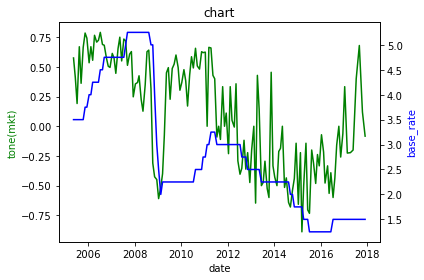

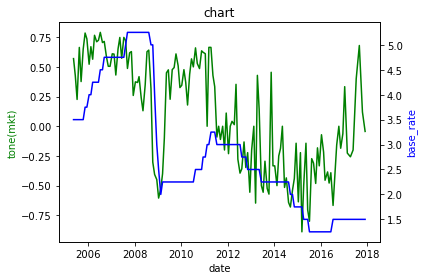

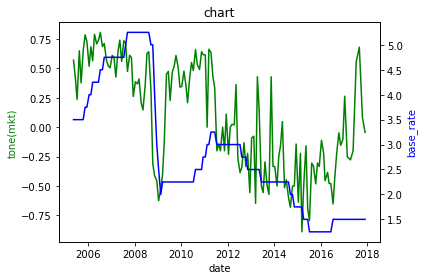

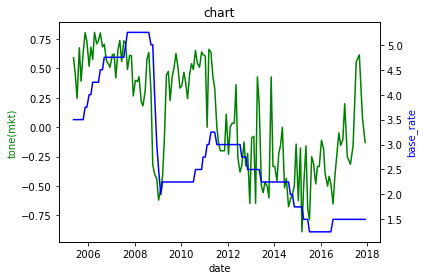

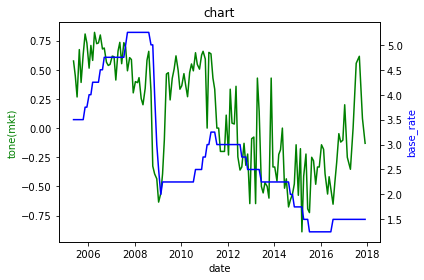

...

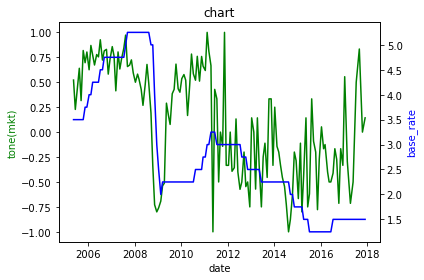

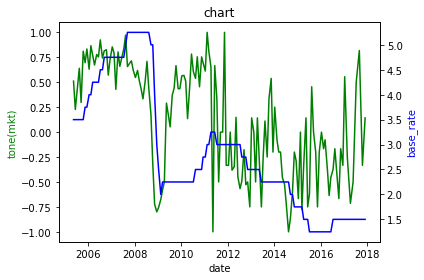

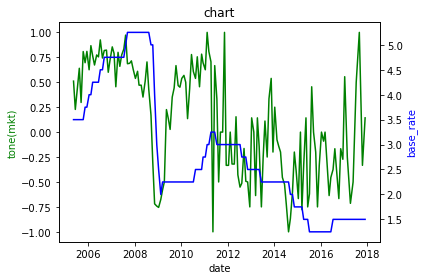

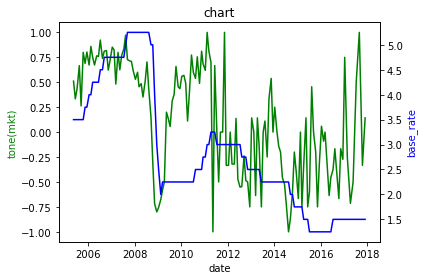

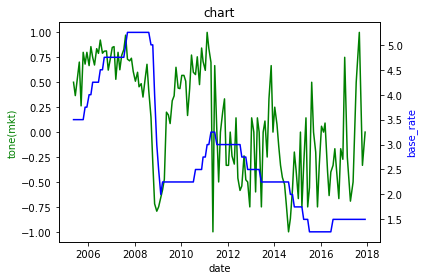

In [427]:
MAX_corr=0
good_threshold=[]
threshold1_list=[5, 6,7,8,9,10,11,12,13,14,15,16,17,18]####그리드서치 돌리기
threshold2_list=[1.1,1.2,1.3,1.4,1.5]####그리드서치 돌리기
threshold3_list=[0,0.01,0.1,0.2]####그리드서치 돌리기
for threshold3 in threshold3_list:
    for threshold2 in threshold2_list:
        for threshold1 in threshold1_list:
            wordfreq = copy.deepcopy(wordfreq_origin)
            for key, value in wordfreq_origin.items():
                if sum(value)<threshold1:
                    del wordfreq[key]
            ###################
            haw_cnt = 0
            dov_cnt = 0
            for val in wordfreq.values():
                haw_cnt+=val[0]
                dov_cnt+=val[1]

            print('haw_cnt:{} dov_cnt:{}'.format(haw_cnt, dov_cnt))
            ################
            k=0.5
            for key, val in wordfreq.items():
                val.append((k+val[0])/(2*k+haw_cnt))
                val.append((k+val[1])/(2*k+dov_cnt))
                val.append(val[2]/val[3])
            #################

            for key, val in wordfreq.items():
                if val[4]>threshold2:
                    wordfreq[key]=1
                elif val[4] < 1/threshold2:
                    wordfreq[key]=-1
                else: wordfreq[key]=0

            #############################
            import numpy as np
            mkb['tone']=0
            polar_list=[]
            count_word=[]
            sentence_score_list=[]

            for i, doc in enumerate(mkb['ngram']):
                cnt=0
                sentence_score=[]
                for sentence in doc:

                    plus=0
                    minus=0
                    for ngram in sentence:
                        if ngram in wordfreq:

                            minus += wordfreq[ngram]
                            plus += np.abs(wordfreq[ngram])


                    if plus!=0:
                        cnt+=1
                        if minus/plus>threshold3:
                            sentence_score.append(1)
                        elif minus/plus<-threshold3:
                            sentence_score.append(-1)

                if sentence_score:
                    sentence_score_list.append(sentence_score)
                    polar = sum(sentence_score)/sum(list(map(abs, sentence_score)))###문서tone구하기
                else : polar =0
                polar_list.append(polar)
                count_word.append(cnt)

            mkb['tone'] = polar_list

            #################
            rate = pd.read_pickle('전체기간_기준금리.pkl')
            tone_rate = mkb.merge(rate, left_index=True, right_index=True, how='left' )

            import matplotlib.pyplot as plt
            fig, ax1 = plt.subplots()  #보조축 차트 만들기
            ax1.set_xlabel('date')
            ax1.set_ylabel('tone(mkt)', color='g')  #라인차트 컬러 지정
            ax1.plot(tone_rate['tone'], 'g-')  #라인차트 형태 지정
            ax2 = ax1.twinx()  #보조축을 위한 X축 공유 지정
            ax2.plot(tone_rate['base_rate'], 'b-')
            ax2.set_ylabel('base_rate', color='b')
            plt.title('chart')
            # plt.grid()
            fig.tight_layout()
#             plt.show()
            print('threshold : {}'.format(threshold))
            print(tone_rate[['tone','base_rate']].corr())
            if MAX_corr<tone_rate[['tone','base_rate']].corr().iloc[0,1]:
                MAX_corr=tone_rate[['tone','base_rate']].corr().iloc[0,1]
                good_threshold=[threshold1,threshold2,threshold3]

In [429]:
MAX_corr

0.6193124738910668

In [428]:
good_threshold

[16, 1.1, 0]